# Singer identification

## Import the library

In [6]:
# For change directory
from os import chdir
# for have a list of all the component's name of one file
from glob import glob
# For mathematical operation
import numpy as np
import pandas as pd
# For plot
import matplotlib.pyplot as plt
import matplotlib.style as ms
ms.use('seaborn-muted')
%matplotlib inline
import matplotlib.gridspec as gridspec
# For audio 
import librosa
import librosa.display
import IPython.display as ipd
# For DWT
import pywt
# For RPCA
from tensorly.decomposition import robust_pca
# import some libraries
import scipy

## Import one file

In [9]:
y,sr=librosa.load('/media/mydata/courses/PROJET/Pratical_part/data2/Celine1.mp3')
sr, y.shape

/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')


(22050, (412992,))

## Exploration of signal

### Display signal

In [39]:
ipd.Audio(y,rate=sr)

### Plot signal

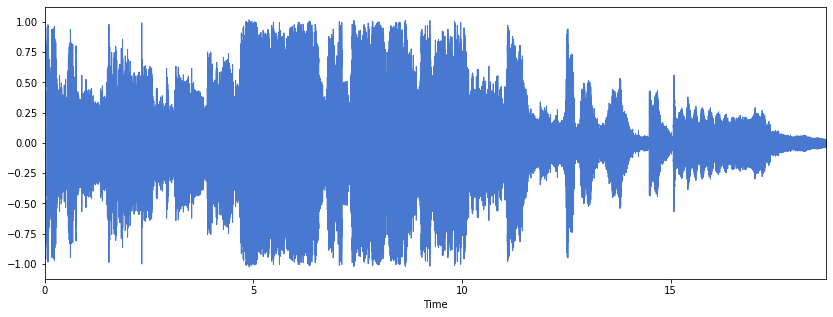

In [40]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y, sr=sr)

### Spectogramme

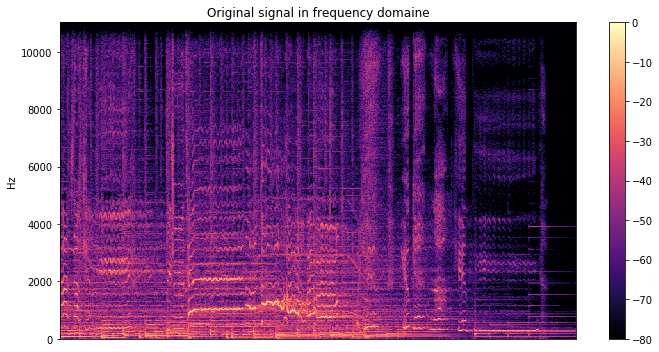

In [41]:
X=librosa.stft(y)
D = librosa.amplitude_to_db(np.abs(X), ref=np.max)
plt.figure(figsize=(10,5))
librosa.display.specshow(D, y_axis='linear')
plt.title('Original signal in frequency domaine')
plt.colorbar()
plt.tight_layout()
plt.show()

### Time-series harmonic-percussive separation: 

The result of this line is that the time series y has been separated into two time series, containing the harmonic (tonal) and percussive (transient) portions of the signal. Each of y_harmonic and y_percussive have the same shape and duration as y.

The motivation for this kind of operation is two-fold: first, percussive elements tend to be stronger indicators of rhythmic content, and can help provide more stable beat tracking results; second, percussive elements can pollute tonal feature representations (such as chroma) by contributing energy across all frequency bands, so we’d be better off without them.


In [42]:
y_harmonic, y_percussive = librosa.effects.hpss(y)

### Chronogramme

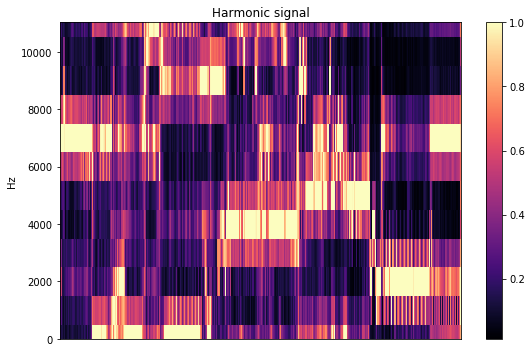

In [43]:
chromagram = librosa.feature.chroma_cqt(y=y_harmonic,sr=sr)
plt.figure(figsize=(8,5))
librosa.display.specshow(chromagram, y_axis='linear')
plt.title('Harmonic signal')
plt.colorbar()
plt.tight_layout()
plt.show()

### Melgramme

## Separation of signal

### Librosa.decompose.decompose

In [44]:
S = np.abs(librosa.stft(y))
comps, acts = librosa.decompose.decompose(S, n_components=8)
comp=librosa.istft(comps)
act=librosa.istft(acts)

In [45]:
ipd.Audio(comp,rate=sr)

In [46]:
ipd.Audio(act,rate=sr)

### Librosa.decompose.hpss

In [47]:
D = librosa.stft(y)
H, P = librosa.decompose.hpss(D,kernel_size=50)
T=librosa.istft(H)
S=librosa.istft(P)

In [48]:
ipd.Audio(S,rate=sr)

### NMF to decompose the spectrogram V as W times H

In [49]:
X=np.abs(librosa.stft(y))
n_components = 8
W, H = librosa.decompose.decompose(X, n_components=n_components, sort=True)

#### Plot the "basis" vectors i.e. columns of W

/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log10
  


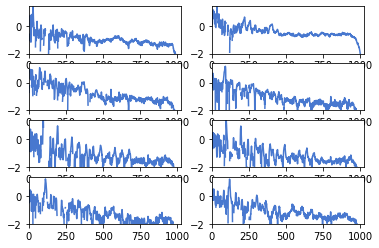

In [50]:
plt.figure()
logW = np.log10(W)
for n in range(n_components):
    plt.subplot(np.ceil(n_components/2.0), 2, n+1)
    plt.plot(logW[:,n])
    plt.ylim(-2, logW.max())
    plt.xlim(0, W.shape[0])

#### Plot the columns of H i.e. the temporal activations

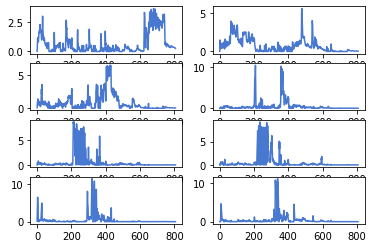

In [51]:
plt.figure()
for n in range(n_components):
    plt.subplot(np.ceil(n_components/2.0), 2, n+1)
    plt.plot(H[n])

#### Listen to individual components

In [52]:
reconstructed_signal = scipy.zeros(len(y))
components = list()
for n in range(n_components):
    Y = scipy.outer(W[:,n], H[n])*np.exp(1j*np.angle(X))
    x = librosa.istft(Y)
    components.append(x)
    reconstructed_signal[:len(x)] += x
    ipd.display( ipd.Audio(x, rate=sr) )

#### Manually select a subset of the components that sound like the drum part and add them up

In [53]:
ipd.Audio(components[0]+components[1]+components[4]+components[5]+components[6],rate=sr)

#### Manually select a subset of componenets that sound most like the guitar and add them up

In [54]:
ipd.Audio(components[2]+components[3]+components[7],rate=sr)

##  RPCA

In [10]:
################ STFT #####################
X=librosa.stft(y)
################ RPCA #####################
low_rank_part, sparse_part = robust_pca(X, reg_E=0.12, learning_rate=1.1, n_iter_max=50)
################ ISTFT #####################
back=librosa.istft(low_rank_part)
foward=librosa.istft(sparse_part)

### plot signal of singer's voice

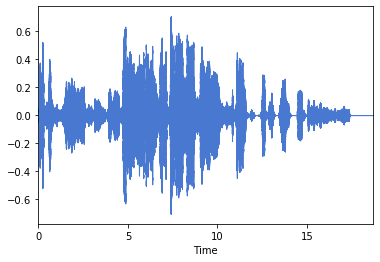

In [56]:
librosa.display.waveplot(foward, sr=sr)

### Display signal of singer's voice

In [57]:
ipd.Audio(foward,rate=sr)

## Spectogram of each signal

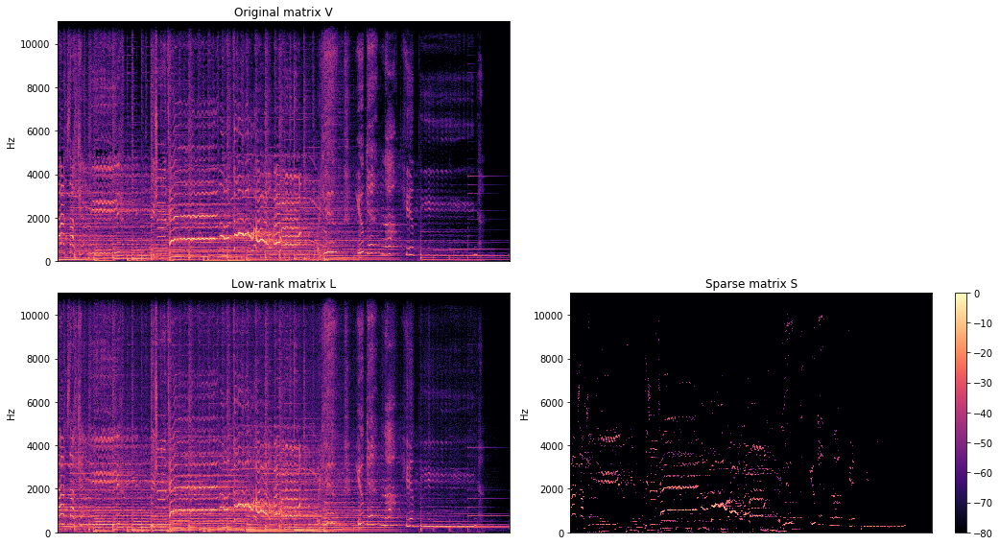

In [58]:
plt.figure(figsize=(15,8))
gs = gridspec.GridSpec(2, 2)
D = librosa.amplitude_to_db(np.abs(X), ref=np.max)
plt.subplot(gs[0, 0])
librosa.display.specshow(D, y_axis='linear')
plt.title('Original matrix V')
E = librosa.amplitude_to_db(np.abs(low_rank_part), ref=np.max)
plt.subplot(gs[1, 0])
librosa.display.specshow(E, y_axis='linear')
plt.title('Low-rank matrix L')
F = librosa.amplitude_to_db(np.abs(sparse_part), ref=np.max)
plt.subplot(gs[1, 1])
librosa.display.specshow(F, y_axis='linear')
plt.title('Sparse matrix S')
plt.colorbar()
plt.tight_layout()
plt.show()

## Separation of all teh dataset and singer identification

### Emport all the data

#### Change directory

In [7]:
# Directory
audio_file_path = "/media/mydata/courses/PROJET/Pratical_part/data2"

# Change directory
chdir(audio_file_path)

#### Change the .mp3 file in .csv file

In [60]:
# List of name of all mp3 files in the working dir
lst = [file for file in glob('*.mp3')]
# Read each .mp3 file and convert it to the .csv file delimiter the number by ","
for i in range(len(lst)):
    y,sr=librosa.load(lst[i])
    np.savetxt(lst[i][0:-4]+".csv", y, delimiter=",")

/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn

/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn

/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn

/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn

/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn('PySoundFile failed. Trying audioread instead.')
/home/victoiredjimna/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:161: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn

#### Group all the .csv files and list of name

In [4]:
#List of name of all .csv files in the working dir
lst1 = [file for file in glob('*.csv')]
lst3=[]
for i in range(len(lst1)):
    if lst1[i][0]=='C':
        lst3.append('Celine')
    elif lst1[i][0]=='A':
        lst3.append('Adele')
    elif lst1[i][0]=='G':
        lst3.append('Garou')
    elif lst1[i][0]=='S':
        lst3.append('Singuila')

200

#### Put all the files in the same  and save

In [66]:
#Concate all the .csv files
OneCSV = pd.concat([pd.read_csv(file,header=None) for file in lst1],axis=1)
#Save it as .csv file
OneCSV.to_csv('global_data.csv', index=False, encoding="utf-8")

#### Remove missing values and save

In [67]:
df=pd.read_csv('global_data.csv')
df1=df.dropna()

In [68]:
# Save data
df1.to_csv('Music_data.csv', index=False, encoding="utf-8")

### Read the data

In [69]:
df=pd.read_csv('Music_data.csv')
# Give the name for each column
#lst2=['Celine2','Celine3','Celine4','Celine5','Celine6','Celine7','Adele7','Adele6','Adele5','Adele4','Adele3','Adele2','Adele1','Garou10','Garou9','Garou8','Garou7','Garou6','Garou5','Garou4','Garou3','Garou2','Garou1','Adele10','Celine1','Adele9','Adele8','Celine10','Celine9','Celine8']
df.columns=lst3
data=df.T
data

,0,1,2,3,4,5,6,7,8,9,...,263222,263223,263224,263225,263226,263227,263228,263229,263230,263231
Celine,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,-0.326206,-0.436468,-0.328141,-0.112590,0.103372,0.157099,0.154621,0.068127,-0.064078,-0.214440
Celine,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,-0.140764,-0.125618,-0.121037,-0.152880,-0.157631,-0.155380,-0.144198,-0.120794,-0.112761,-0.098944
Celine,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.165244,0.165054,0.169416,0.140268,0.159569,0.160370,0.137768,0.153719,0.161612,0.160460
Celine,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,-0.047896,-0.044038,-0.034804,-0.028014,-0.019758,-0.008601,0.004647,0.014084,0.017615,0.025606
Celine,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,-0.030329,-0.024833,-0.019544,-0.015370,-0.008671,-0.006518,-0.001637,0.001855,0.003510,0.002946
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Singuila,-4.622849e-08,2.570609e-08,9.013488e-10,-3.384897e-08,7.342248e-08,-1.198742e-07,1.737276e-07,-2.358922e-07,3.082636e-07,-3.943798e-07,...,0.214074,0.299122,0.468273,0.405473,0.377973,0.423760,0.383686,0.411272,0.419915,0.419997
Singuila,-4.953813e-06,-4.685368e-06,1.370317e-06,-6.457152e-07,2.936452e-07,-7.008957e-08,-8.956838e-08,2.086123e-07,-2.970188e-07,3.600391e-07,...,0.160415,0.336708,0.414352,0.201494,0.332684,0.454660,0.402023,0.349100,0.091906,-0.007633
Singuila,-4.800558e-06,-4.861741e-06,1.567479e-06,-8.595943e-07,5.181948e-07,-2.969772e-07,1.288632e-07,1.215599e-08,-1.389587e-07,2.599972e-07,...,-0.531532,-0.584692,-0.496832,-0.464396,-0.478277,-0.576418,-0.593420,-0.471148,-0.409576,-0.508159
Singuila,-4.652384e-06,-5.051968e-06,1.801851e-06,-1.138697e-06,8.407789e-07,-6.596534e-07,5.258113e-07,-4.104556e-07,2.975640e-07,-1.749836e-07,...,-0.373078,-0.115735,-0.495879,-0.493572,-0.466402,-0.636319,-0.654569,-0.533755,-0.367825,-0.314558


### Remove Background music in my dataset

In [70]:
lstofdf = data.to_numpy()
lstfinaldf=[]
for i in range(len(lstofdf)):
    y=lstofdf[i]
    X=librosa.stft(y)
    low_rank_part, sparse_part = robust_pca(X, reg_E=0.12, learning_rate=1.1, n_iter_max=50)
    back=librosa.istft(low_rank_part)
    foward=librosa.istft(sparse_part)
    lstfinaldf.append(foward)

In [75]:
ipd.Audio(lstfinaldf[1],rate=sr)

In [76]:
df= pd.DataFrame(lstfinaldf) 
finaldf=df.T
finaldf.to_csv('final_data.csv', index=False, encoding="utf-8")

In [8]:
d=pd.read_csv('final_data.csv')
d

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,-0.015948,-0.003060,-0.007804,0.000343,0.000000,0.000000,-0.038464,-0.007260,-0.000859,-0.003807,...,-0.000721,-0.009846,0.008650,0.003245,0.098130,-0.015522,-0.024112,0.009143,0.001813,0.002992
1,-0.021025,-0.003395,-0.005254,0.000216,0.000000,0.000000,-0.025359,-0.007086,-0.000836,-0.003539,...,-0.000457,-0.001885,-0.001873,0.003665,0.093423,-0.020695,-0.026290,-0.009991,-0.000494,-0.001388
2,-0.024122,-0.003619,-0.001886,0.000038,0.000000,0.000000,-0.011424,-0.006882,-0.000796,-0.003208,...,0.000770,0.015308,-0.020871,0.004405,0.097329,-0.023954,-0.023070,0.003230,0.009583,-0.001330
3,-0.023574,-0.003764,0.001970,-0.000150,0.000000,0.000000,0.001375,-0.006648,-0.000740,-0.002817,...,0.002534,0.031518,-0.038754,0.005277,0.101886,-0.023451,-0.008032,0.003441,0.027555,0.007789
4,-0.018674,-0.003857,0.005888,-0.000300,0.000000,0.000000,0.011701,-0.006384,-0.000668,-0.002372,...,0.004141,0.039125,-0.030435,0.005851,0.103437,-0.024720,0.007306,0.002890,0.013380,0.003483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
263163,0.107028,-0.110153,0.008993,0.024033,-0.047418,-0.077657,0.010035,-0.168080,-0.016526,0.106230,...,0.066886,0.259959,-0.069245,-0.077210,-0.038087,-0.189705,0.009261,-0.176625,-0.200206,-0.032966
263164,0.111363,-0.128534,0.011612,0.022719,-0.047740,0.067383,-0.040815,-0.144209,-0.019033,0.130603,...,0.065452,0.267820,-0.071594,-0.075821,-0.026901,-0.197344,0.017136,-0.176565,-0.169349,-0.042778
263165,0.042921,-0.118635,0.015421,0.021472,-0.048032,0.211918,0.011887,-0.112261,-0.019750,0.117669,...,0.057004,0.272327,-0.074395,-0.069010,-0.043247,-0.218204,0.003816,-0.186211,-0.156225,-0.054421
263166,-0.077803,-0.087783,0.021193,0.020322,-0.048294,0.343645,0.125600,-0.079017,-0.018953,0.129445,...,0.043405,0.275927,-0.076805,-0.061794,-0.057501,-0.195893,-0.026509,-0.191694,-0.176400,-0.064886
